In [200]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import plotly.express as px
import seaborn as sns
from sklearn.preprocessing import StandardScaler, LabelEncoder
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, confusion_matrix
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense, Dropout
from tensorflow.keras.callbacks import EarlyStopping
from scipy.cluster import hierarchy
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis as LDA
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
import lightgbm as lgb
from bayes_opt import BayesianOptimization

# Combining both Data sets as it would be better for EDA and cross validation

In [2]:
train_df=pd.read_csv('train.csv')
test_df=pd.read_csv('test.csv')

In [3]:
print('Shape of Train Data :',train_df.shape)
print('Shape of Test Data :',test_df.shape)

Shape of Train Data : (7352, 563)
Shape of Test Data : (2947, 563)


**Checking the database for null values:**

In [4]:
print('Train Null Values:',train_df.isnull().values.sum())
print('Test Null Values:',test_df.isnull().values.sum())

Train Null Values: 0
Test Null Values: 0


The database does not include any missing values. Now we can move on to the next step, checking for duplicates in the data: 

**Checking the database for duplicates:**

In [5]:
print('Number of duplicates in train set:{}'.format(sum(train_df.duplicated())))
print('Number of duplicates in test set:{}'.format(sum(test_df.duplicated())))
#print('Duplicated data',train_df.duplicated().values.sum())

Number of duplicates in train set:0
Number of duplicates in test set:0


Checking if the train df and test df have the same columns

In [6]:
if train_df.columns.all() == test_df.columns.all():
    print('All columns are same')

All columns are same


In [9]:
df = pd.concat([train_df, test_df], ignore_index = True)

In [12]:
df.head()

,tBodyAcc-mean()-X,tBodyAcc-mean()-Y,tBodyAcc-mean()-Z,tBodyAcc-std()-X,tBodyAcc-std()-Y,tBodyAcc-std()-Z,tBodyAcc-mad()-X,tBodyAcc-mad()-Y,tBodyAcc-mad()-Z,tBodyAcc-max()-X,...,fBodyBodyGyroJerkMag-kurtosis(),"angle(tBodyAccMean,gravity)","angle(tBodyAccJerkMean),gravityMean)","angle(tBodyGyroMean,gravityMean)","angle(tBodyGyroJerkMean,gravityMean)","angle(X,gravityMean)","angle(Y,gravityMean)","angle(Z,gravityMean)",subject,Activity
0,0.288585,-0.020294,-0.132905,-0.995279,-0.983111,-0.913526,-0.995112,-0.983185,-0.923527,-0.934724,...,-0.710304,-0.112754,0.030400,-0.464761,-0.018446,-0.841247,0.179941,-0.058627,1,STANDING
1,0.278419,-0.016411,-0.123520,-0.998245,-0.975300,-0.960322,-0.998807,-0.974914,-0.957686,-0.943068,...,-0.861499,0.053477,-0.007435,-0.732626,0.703511,-0.844788,0.180289,-0.054317,1,STANDING
2,0.279653,-0.019467,-0.113462,-0.995380,-0.967187,-0.978944,-0.996520,-0.963668,-0.977469,-0.938692,...,-0.760104,-0.118559,0.177899,0.100699,0.808529,-0.848933,0.180637,-0.049118,1,STANDING
3,0.279174,-0.026201,-0.123283,-0.996091,-0.983403,-0.990675,-0.997099,-0.982750,-0.989302,-0.938692,...,-0.482845,-0.036788,-0.012892,0.640011,-0.485366,-0.848649,0.181935,-0.047663,1,STANDING
4,0.276629,-0.016570,-0.115362,-0.998139,-0.980817,-0.990482,-0.998321,-0.979672,-0.990441,-0.942469,...,-0.699205,0.123320,0.122542,0.693578,-0.615971,-0.847865,0.185151,-0.043892,1,STANDING


In [14]:
print('Total Data Shape:',df.shape)

Total Data Shape: (10299, 563)


In [18]:
df['subject'].groupby(df['subject']).count()

subject
1     347
2     302
3     341
4     317
5     302
6     325
7     308
8     281
9     288
10    294
11    316
12    320
13    327
14    323
15    328
16    366
17    368
18    364
19    360
20    354
21    408
22    321
23    372
24    381
25    409
26    392
27    376
28    382
29    344
30    383
Name: subject, dtype: int64

The Database has 30 subjects and each indivual has performed around >300 tasks to make the total reach 10299

In [28]:
train_df['subject'].groupby(train_df['Activity']).value_counts()

Activity          subject
LAYING            21         90
                  19         83
                  28         80
                  26         76
                  27         74
                             ..
WALKING_UPSTAIRS  21         47
                  5          47
                  22         42
                  8          41
                  19         40
Name: count, Length: 126, dtype: int64

So we have 30 subjects and each perfomed different trials.
Now lets look at how many trials of each activity exist in our train dataset:

In [29]:
train_df['Activity'].groupby(train_df['Activity']).count()

Activity
LAYING                1407
SITTING               1286
STANDING              1374
WALKING               1226
WALKING_DOWNSTAIRS     986
WALKING_UPSTAIRS      1073
Name: Activity, dtype: int64

# Conclusions till now
* We have 30 subjects. 
* In database each datapoint is one of the six activities.
* Each subject repeated the activity several times
* Each Subject seems to have around equal contribution to dataset in tota but the contribution in each activity vary
* Since it is a classification problem, we can use multiple different models to train the dataset on

**Check for data imbalance:**

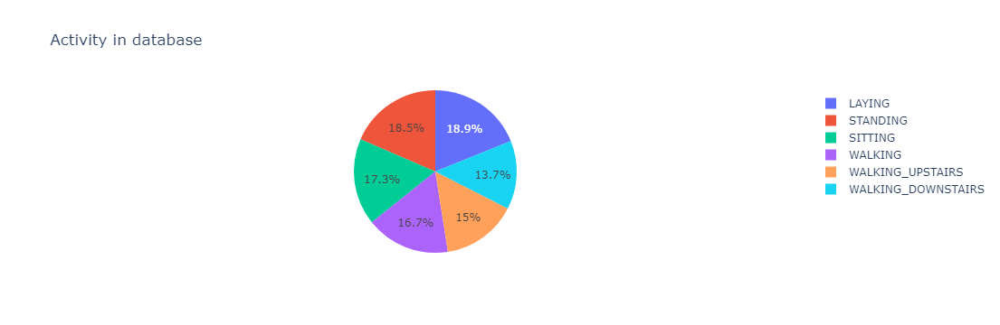

In [30]:
px.pie(df,names='Activity',title='Activity in database')

So pie plot shows that the data is fairly balanced.

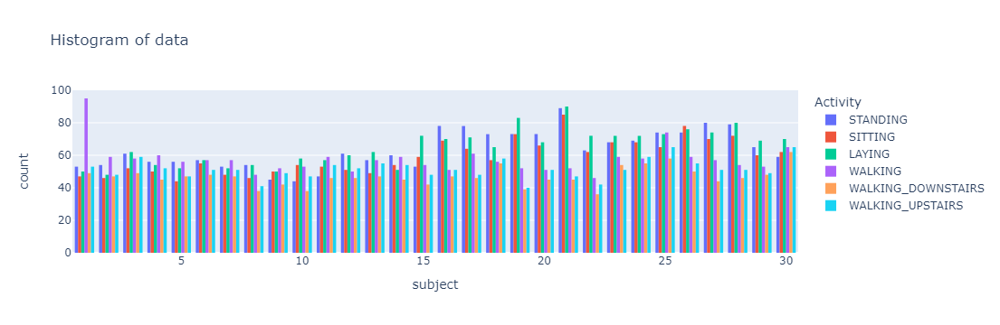

In [31]:
px.histogram(data_frame=df,x='subject',color='Activity',barmode='group',title='Histogram of data')

The Data Seems quite consistent and balanced apart from some exceptions, to emphasize that lets make more plots

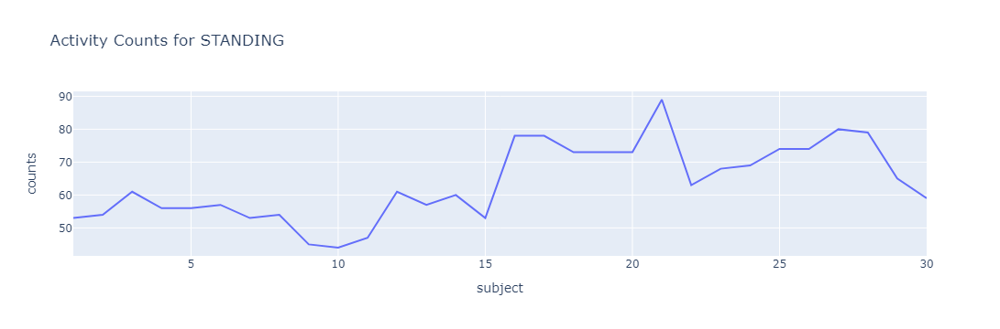

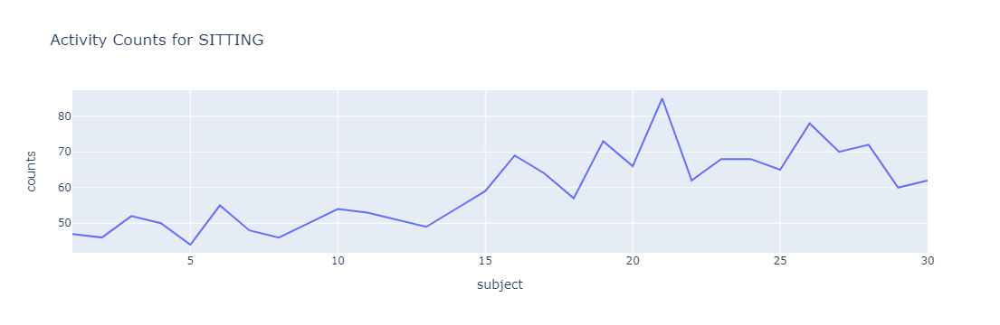

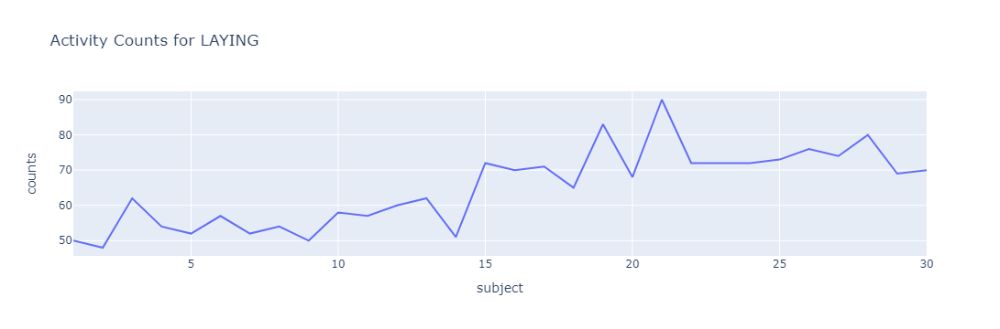

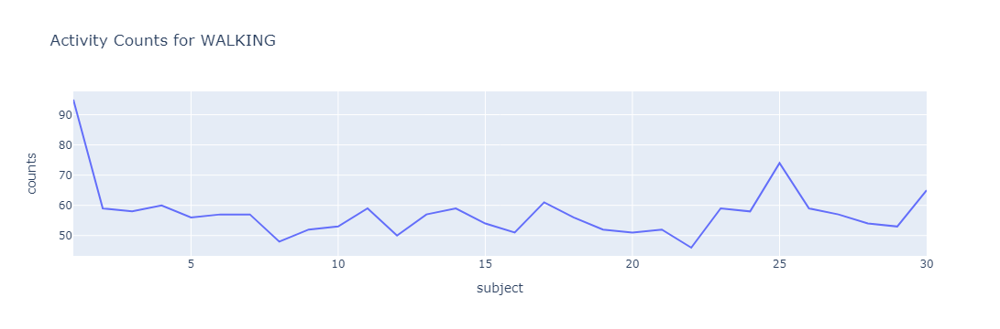

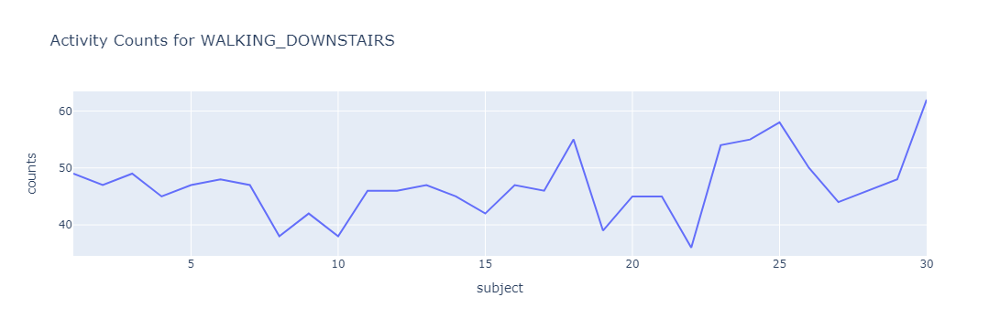

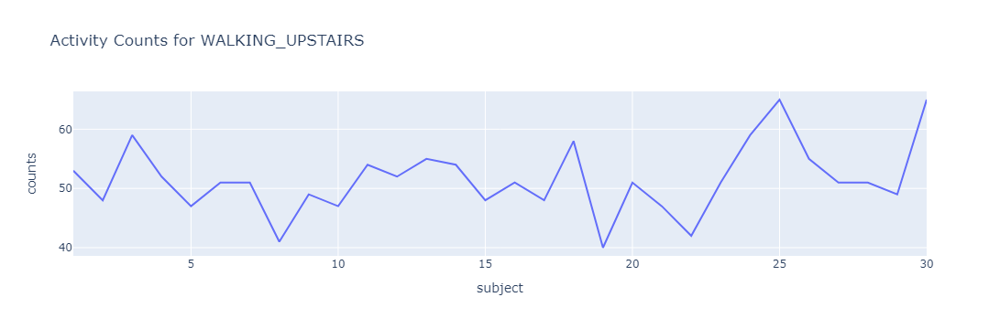

In [34]:
activity_counts = df.groupby(['subject', 'Activity']).size().reset_index(name='counts')
figures = []
for activity in df['Activity'].unique():
    activity_df = activity_counts[activity_counts['Activity'] == activity]
    fig = px.line(activity_df, x='subject', y='counts', title=f'Activity Counts for {activity}')
    figures.append(fig)
for figure in figures:
    figure.show()

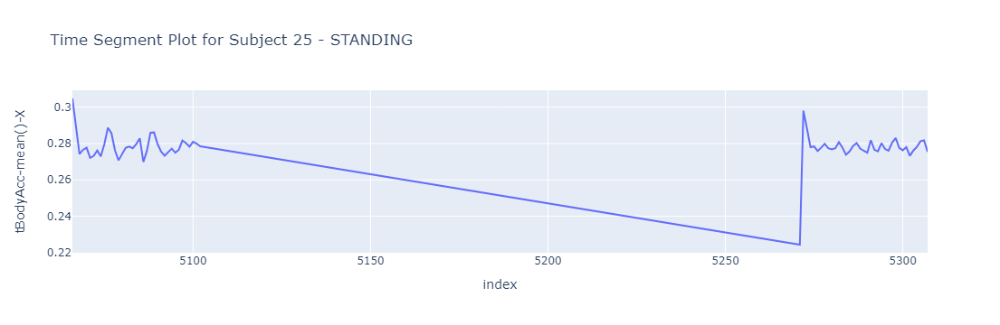

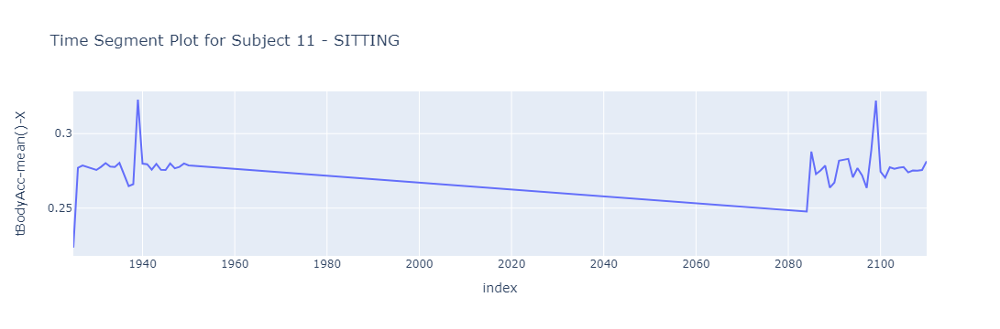

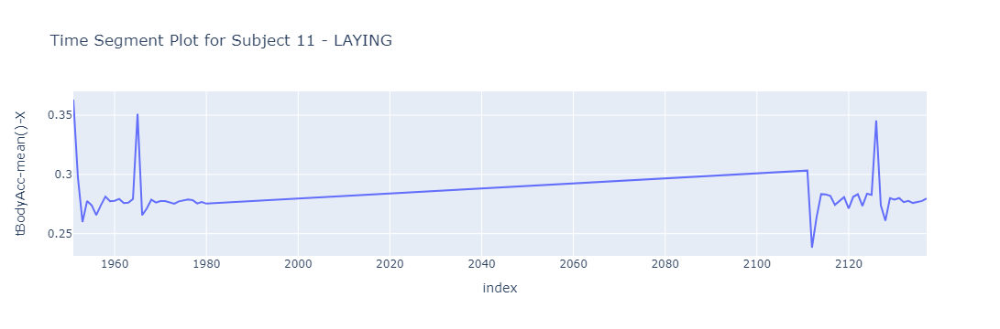

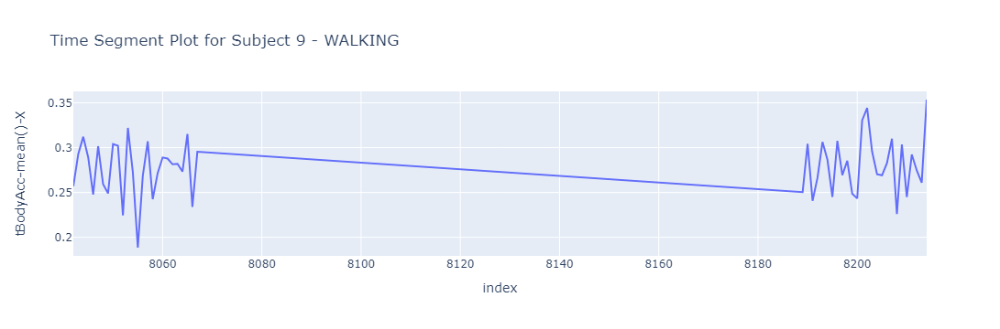

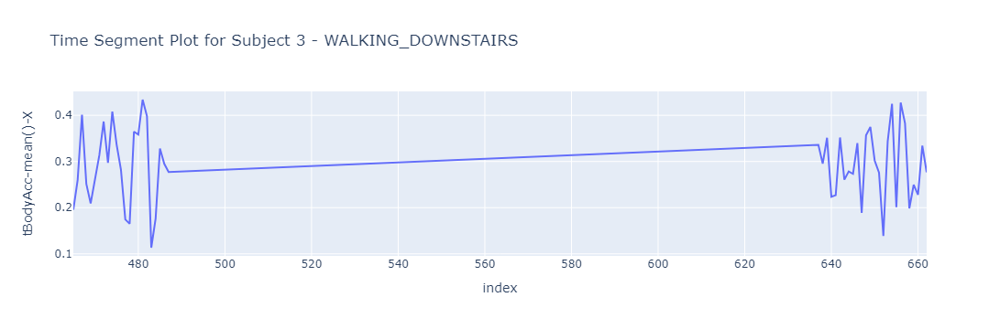

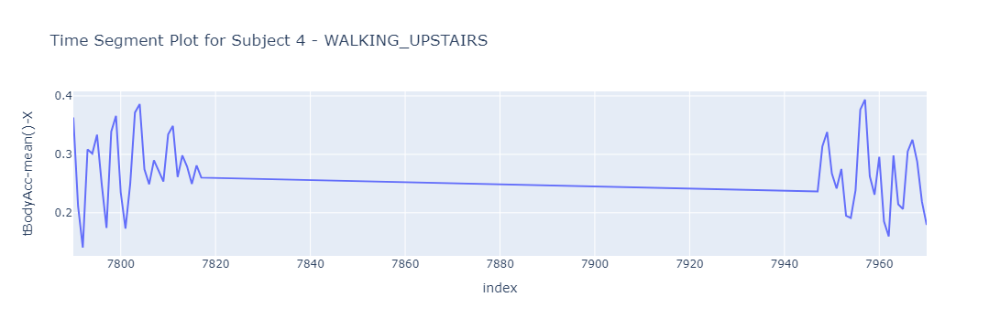

In [43]:
activity = df['Activity'].unique()
figures = []
for i in activity:
    subject_id = np.random.randint(1,30)
    filtered_df = df[(df['subject'] == subject_id) & (df['Activity'] == i)]
    filtered_df = filtered_df.reset_index()
    fig = px.line(filtered_df, x='index', y='tBodyAcc-mean()-X', title=f'Time Segment Plot for Subject {subject_id} - {i}')
    figures.append(fig)
for fig in figures:
    fig.show()


This figure shows the time segment plots for each activity for random subjects, the gap between continuous values is due to Sampling and Noise Filtering. But these sampling rates are sufficient to capture variability in data

# Data exploration

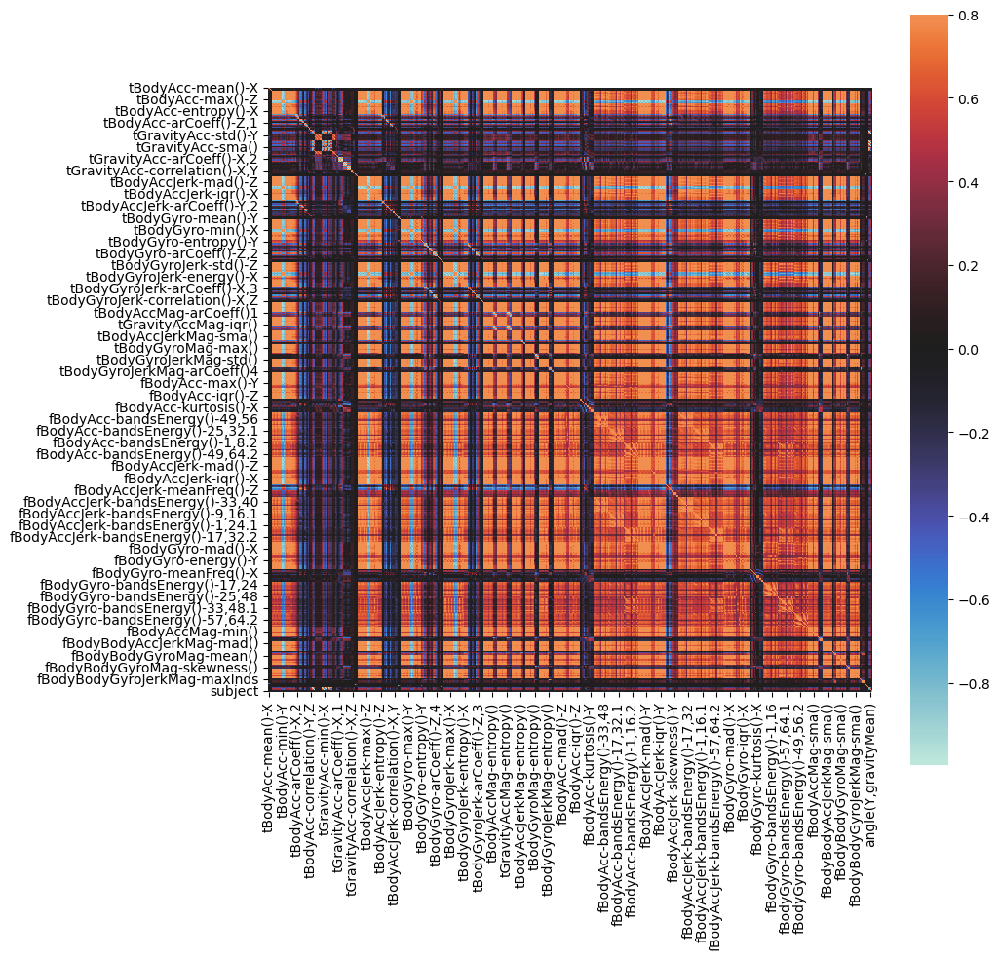

In [51]:
corrmat=df.drop(['Activity'],axis=1).corr()
f,ax=plt.subplots(figsize=(10,10))
sns.heatmap(corrmat,vmax=0.8,square=True, center = 0) 
plt.show()

The dataset has lost of feaures that are highly correlated with each other.

This could be because of redudancy of data and derived features as the the 561 columns in the data are made by different statistical operations on the same sensor values

The almost balck(Dull columns) indicate no correlation

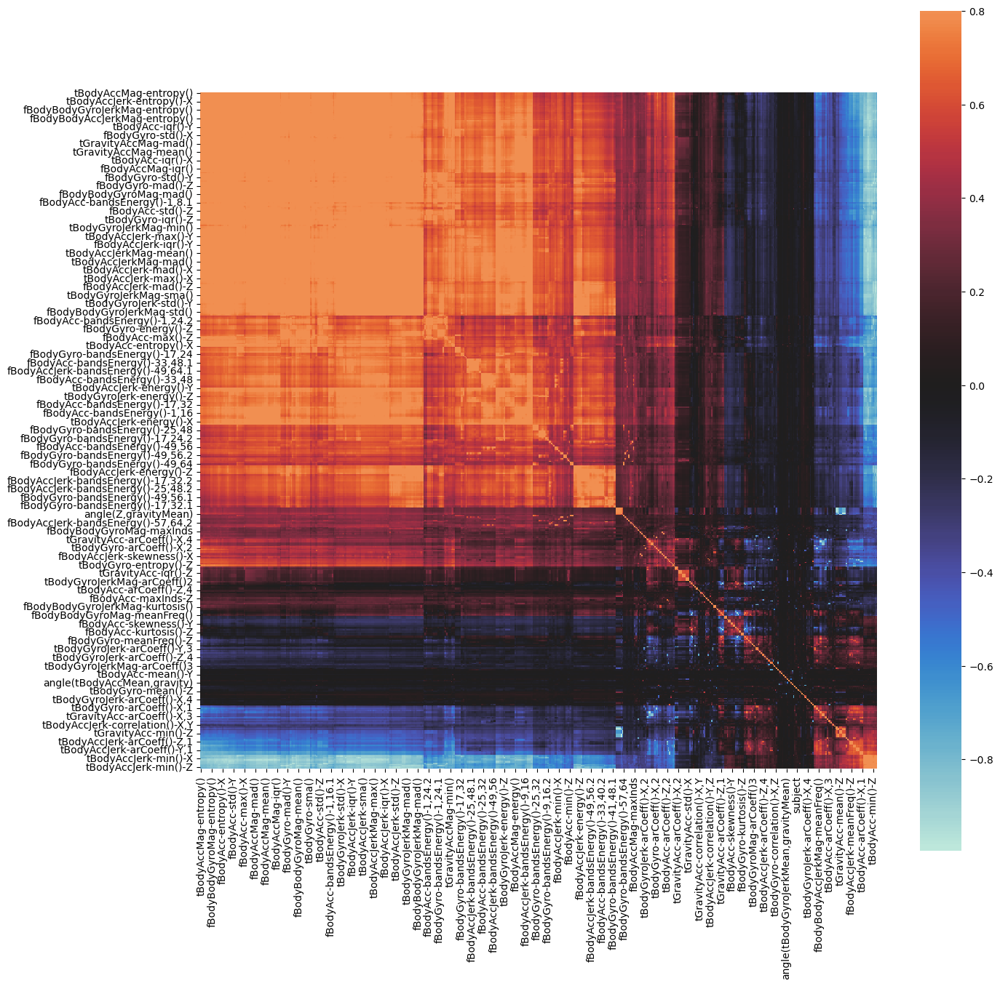

In [50]:
linkage = hierarchy.linkage(hierarchy.distance.pdist(corrmat), method='ward')
order = hierarchy.leaves_list(hierarchy.optimal_leaf_ordering(linkage, hierarchy.distance.pdist(corrmat)))
corrmat_clustered = corrmat.iloc[order, order]
f, ax = plt.subplots(figsize=(15, 15))
sns.heatmap(corrmat_clustered, vmax=.8, center=0,
            square=True)
plt.show()

Blocks of High Correlation: The clustering has grouped features that are highly correlated (bright red areas), creating visible blocks. These blocks indicate groups of features that have similar relationships with others, possibly representing similar underlying factors.

Negative Correlations: There are also areas with strong negative correlations (bright blue), although less extensive than the positive ones. These features move inversely to each other and could be considered for feature engineering to capture inverse relationship

Therefore clustering the similar data in order is helpful as it made the correlation matrix more interpretables.

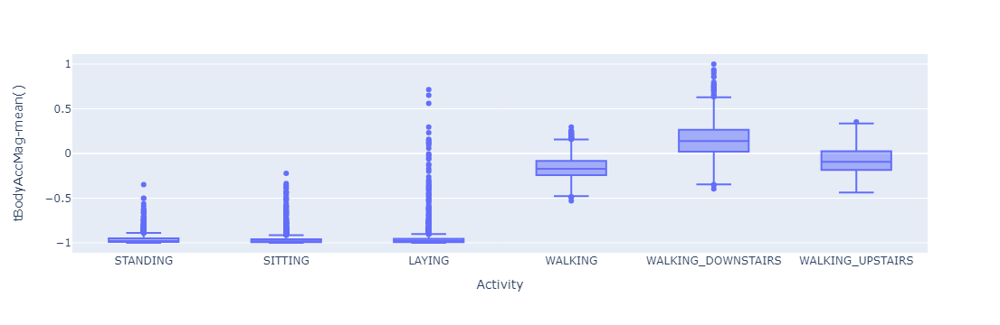

In [17]:
px.box(train_df, x='Activity',y='tBodyAccMag-mean()')

Boxplot of mean magnitude of acceleration shows that dynamic activities are  much differnet from static activities

As the dimensionality of our Data is very high it would be recommended to do perform PCA on the data before making our Model

# Scaling and Encoding the Data

In [114]:
X = df.drop(['Activity','subject'],axis=1)
Y = df['Activity']
X_train, X_test, Y_train, Y_test = train_test_split(X, Y, test_size=0.3, random_state=42)
scaler = StandardScaler()
X_train = scaler.fit_transform(X_train)
X_test = scaler.transform(X_test)
label_encoder = LabelEncoder()
Y_train_encoded = label_encoder.fit_transform(Y_train)
Y_test_encoded = label_encoder.transform(Y_test)

# Dimensionality Reduction

t-Distributed Stochastic Neighbor Embedding (TSNE)

In [127]:
X_scaled = scaler.fit_transform(X)
tsne = TSNE(n_components=2, random_state=42, perplexity=50, n_iter=1000)
X_tsne = tsne.fit_transform(X_scaled)
tsne_df = pd.DataFrame({'Component 1': X_tsne[:, 0], 'Component 2': X_tsne[:, 1], 'Activity': Y})

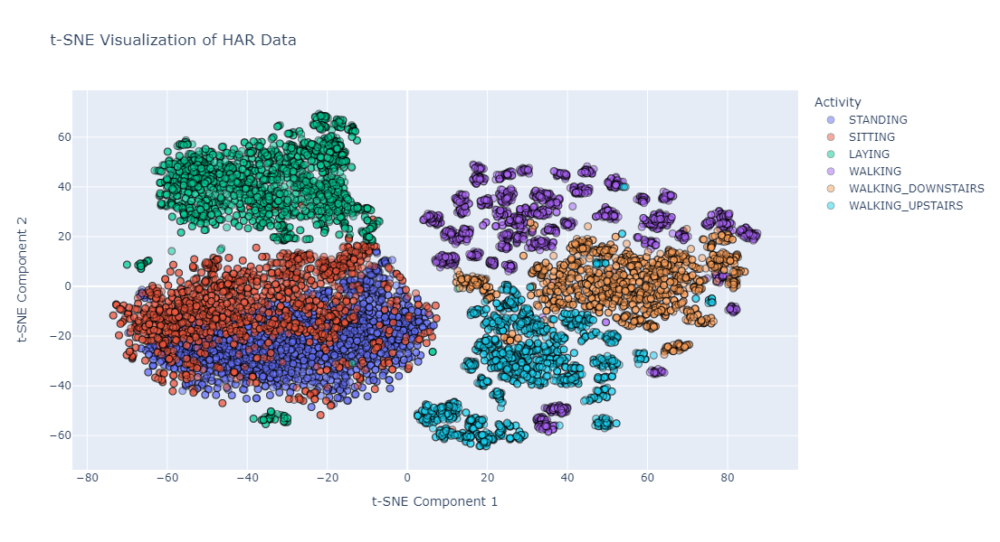

In [129]:
fig = px.scatter(tsne_df, x='Component 1', y='Component 2', color='Activity',
                 title='t-SNE Visualization of HAR Data',
                 labels={'Component 1': 't-SNE Component 1', 'Component 2': 't-SNE Component 2'},
                 width=800, height=600)
fig.update_traces(marker=dict(size=8, opacity=0.5, line=dict(width=1, color='DarkSlateGrey')))

fig.show()

LDA

In [115]:
lda = LDA()
X_train_LDA = lda.fit_transform(X_train,Y_train_encoded)
X_test_LDA = lda.transform(X_test)

Dimension reduced by LDA creates columns of number of classes -1 there for X_LDA has 5 columns

In [116]:
pred = lda.predict(X_test)
accuracy_score(pred,Y_test_encoded)

0.9754045307443365

PCA

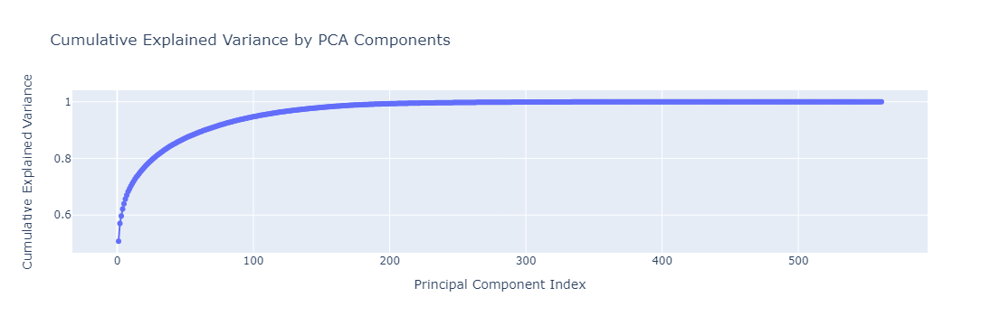

In [122]:
pca = PCA().fit(X_train)
variance = pca.explained_variance_ratio_
cumulative_variance = variance.cumsum()
data = {
    'Principal Component Index': range(1, len(cumulative_variance) + 1),
    'Cumulative Explained Variance': cumulative_variance
}
df_plot = pd.DataFrame(data)
fig = px.line(df_plot, 
              x='Principal Component Index', 
              y='Cumulative Explained Variance',
              markers=True, # Add markers to the line
              title='Cumulative Explained Variance by PCA Components')
fig.update_layout(
    xaxis_title='Principal Component Index',
    yaxis_title='Cumulative Explained Variance',
    legend_title='Variance'
)
fig.show()

Analyzing this chart we should use explained variance of 95% as after that there are diminishing returns 

In [118]:
pca = PCA(n_components=0.95)
X_train_PCA = pca.fit_transform(X_train)
X_test_PCA = pca.transform(X_test)
variance_ratios = pca.explained_variance_ratio_
num_components_kept = X_train_PCA.shape[1]
print(variance_ratios)
print(f'Number of components to retain 95% variance: {num_components_kept}')

[0.50740171 0.06274703 0.02648558 0.02445993 0.01901506 0.01613203
 0.01409133 0.01230236 0.00995815 0.0095718  0.00858328 0.0081454
 0.00781463 0.00670312 0.00631585 0.00618468 0.00595765 0.00588688
 0.00571088 0.0053808  0.00521138 0.0050685  0.00478182 0.00465341
 0.00446003 0.00440862 0.00415286 0.00402137 0.00386491 0.00383982
 0.00364852 0.00360755 0.00353671 0.00347428 0.00334921 0.0032754
 0.00320897 0.00305146 0.00293233 0.00287765 0.00279018 0.00269576
 0.00267952 0.0025784  0.00257132 0.00247326 0.00245568 0.00243532
 0.00234166 0.00232799 0.00226222 0.00219152 0.00214223 0.00212421
 0.00203246 0.00201464 0.00195355 0.00193189 0.00192415 0.00188955
 0.00185776 0.00183139 0.00182333 0.00177432 0.00173229 0.00169496
 0.00169324 0.0016597  0.00165513 0.00162278 0.00161249 0.00156581
 0.00151341 0.00149925 0.0014761  0.0014685  0.00143909 0.00142458
 0.00141626 0.00136193 0.00134557 0.00131611 0.00130679 0.00127677
 0.00126614 0.00123715 0.00120541 0.00119416 0.00118531 0.001165

# LIGHT GRADIENT BOOSTING WITH BAYESIAN OPTIMIZATION

In [208]:
def evaluate_model(model, X_test, Y_test):
    Y_pred_prob = model.predict(X_test)
    Y_pred = np.argmax(Y_pred_prob, axis=1)
    testing_accuracy = accuracy_score(Y_test, Y_pred)
    print("Testing Accuracy:", testing_accuracy)
    conf_matrix = confusion_matrix(Y_test, Y_pred)
    print("Confusion Matrix:")
    conf_matrix_norm = conf_matrix.astype('float')*100 / conf_matrix.sum(axis=1)[:, np.newaxis]
    print(conf_matrix)
    return testing_accuracy, conf_matrix

In [ ]:
def lgb_eval(num_leaves, feature_fraction, bagging_fraction, max_depth, lambda_l1, lambda_l2, min_split_gain, min_child_weight):
    params = {
        "objective" : "multiclass",
        "num_class" : len(np.unique(Y)),
        "num_leaves": int(num_leaves),
        "learning_rate" : 0.05,
        "feature_fraction" : max(min(feature_fraction, 1), 0),
        "bagging_fraction" : max(min(bagging_fraction, 1), 0),
        "max_depth": int(max_depth),
        "lambda_l1": max(lambda_l1, 0),
        "lambda_l2": max(lambda_l2, 0),
        "min_split_gain": min_split_gain,
        "min_child_weight": min_child_weight,
        "verbose" : -1
    }
    
    lgtrain = lgb.Dataset(X_train, label = Y_train_encoded)
    cv_result = lgb.cv(params,
                       lgtrain,
                       nfold=5,
                       metrics="multi_logloss",
                       stratified=True,
                       seed=42)
    
    return -min(cv_result['valid multi_logloss-mean']) 

In [153]:
param_bounds = {
    'num_leaves': (24, 45),
    'feature_fraction': (0.1, 0.9),
    'bagging_fraction': (0.8, 1),
    'max_depth': (5, 8.99),
    'lambda_l1': (0, 5),
    'lambda_l2': (0, 3),
    'min_split_gain': (0.001, 0.1),
    'min_child_weight': (5, 50)
}
optimizer = BayesianOptimization(f=lgb_eval, pbounds=param_bounds, random_state=42)
optimizer.maximize(init_points=10, n_iter=25)

|   iter    |  target   | baggin... | featur... | lambda_l1 | lambda_l2 | max_depth | min_ch... | min_sp... | num_le... |
-------------------------------------------------------------------------------------------------------------------------
| 1         | -0.07737  | 0.8749    | 0.8606    | 3.66      | 1.796     | 5.623     | 12.02     | 0.00675   | 42.19     |
| 2         | -0.07047  | 0.9202    | 0.6665    | 0.1029    | 2.91      | 8.321     | 14.56     | 0.019     | 27.85     |
| 3         | -0.06973  | 0.8608    | 0.5198    | 2.16      | 0.8737    | 7.441     | 11.28     | 0.02992   | 31.69     |
| 4         | -0.05947  | 0.8912    | 0.7281    | 0.9984    | 1.543     | 7.364     | 7.09      | 0.06115   | 27.58     |
| 5         | -0.07853  | 0.813     | 0.8591    | 4.828     | 2.425     | 6.215     | 9.395     | 0.06874   | 33.24     |
| 6         | -0.1031   | 0.8244    | 0.4961    | 0.1719    | 2.728     | 6.033     | 34.81     | 0.03186   | 34.92     |
| 7         | -0.1279   

In [184]:
best_params = optimizer.max['params']
print(best_params)
best_params['num_leaves'] = int(best_params['num_leaves'])
best_params['max_depth'] = int(best_params['max_depth'])
best_params.update({
    'objective': 'multiclass',
    'num_class': len(np.unique(Y)),
    'learning_rate': 0.05,
    'boosting_type': 'gbdt',
    'metric': 'multi_logloss',
    'verbose': -1
})
train_data = lgb.Dataset(X_train[:np.round(0.8*len(X_train)).astype(int),:], label=Y_train_encoded[:np.round(0.8*len(X_train)).astype(int)])
valid_data = lgb.Dataset(X_train[np.round(0.8*len(X_train)).astype(int):,:], label=Y_train_encoded[np.round(0.8*len(X_train)).astype(int):], reference=train_data)
lgb_model = lgb.train(best_params,
                      train_data,
                      num_boost_round=1000,
                      valid_sets=[valid_data],)

{'bagging_fraction': 1.0, 'feature_fraction': 0.9, 'lambda_l1': 0.0, 'lambda_l2': 0.0, 'max_depth': 6.894995874938907, 'min_child_weight': 5.0, 'min_split_gain': 0.1, 'num_leaves': 42.60637863902647}


In [209]:
e = evaluate_model(lgb_model,X_test,Y_test_encoded)

Testing Accuracy: 0.9854368932038835
Confusion Matrix:
[[597   0   0   0   0   0]
 [  0 541  19   0   0   3]
 [  0  14 533   0   0   0]
 [  0   0   0 537   0   2]
 [  0   0   0   3 415   2]
 [  0   0   0   0   2 422]]


In [192]:
def lgb_eval_PCA(num_leaves, feature_fraction, bagging_fraction, max_depth, lambda_l1, lambda_l2, min_split_gain, min_child_weight):
    params = {
        "objective" : "multiclass",
        "num_class" : len(np.unique(Y)),
        "num_leaves": int(num_leaves),
        "learning_rate" : 0.05,
        "feature_fraction" : max(min(feature_fraction, 1), 0),
        "bagging_fraction" : max(min(bagging_fraction, 1), 0),
        "max_depth": int(max_depth),
        "lambda_l1": max(lambda_l1, 0),
        "lambda_l2": max(lambda_l2, 0),
        "min_split_gain": min_split_gain,
        "min_child_weight": min_child_weight,
        "verbose" : -1
    }
    
    lgtrain = lgb.Dataset(X_train_PCA, label = Y_train_encoded)
    cv_result = lgb.cv(params,
                       lgtrain,
                       nfold=5,
                       metrics="multi_logloss",
                       stratified=True,
                       seed=42)
    
    return -min(cv_result['valid multi_logloss-mean'])

In [194]:
optimizer = BayesianOptimization(f=lgb_eval, pbounds=param_bounds, random_state=42)
optimizer.maximize(init_points=10, n_iter=25)

|   iter    |  target   | baggin... | featur... | lambda_l1 | lambda_l2 | max_depth | min_ch... | min_sp... | num_le... |
-------------------------------------------------------------------------------------------------------------------------
| 1         | -0.07737  | 0.8749    | 0.8606    | 3.66      | 1.796     | 5.623     | 12.02     | 0.00675   | 42.19     |
| 2         | -0.07047  | 0.9202    | 0.6665    | 0.1029    | 2.91      | 8.321     | 14.56     | 0.019     | 27.85     |
| 3         | -0.06973  | 0.8608    | 0.5198    | 2.16      | 0.8737    | 7.441     | 11.28     | 0.02992   | 31.69     |
| 4         | -0.05947  | 0.8912    | 0.7281    | 0.9984    | 1.543     | 7.364     | 7.09      | 0.06115   | 27.58     |
| 5         | -0.07853  | 0.813     | 0.8591    | 4.828     | 2.425     | 6.215     | 9.395     | 0.06874   | 33.24     |
| 6         | -0.1031   | 0.8244    | 0.4961    | 0.1719    | 2.728     | 6.033     | 34.81     | 0.03186   | 34.92     |
| 7         | -0.1279   

In [195]:
best_params = optimizer.max['params']
print(best_params)
best_params['num_leaves'] = int(best_params['num_leaves'])
best_params['max_depth'] = int(best_params['max_depth'])
best_params.update({
    'objective': 'multiclass',
    'num_class': len(np.unique(Y)),
    'learning_rate': 0.05,
    'boosting_type': 'gbdt',
    'metric': 'multi_logloss',
    'verbose': -1
})
train_data = lgb.Dataset(X_train_PCA[:np.round(0.8*len(X_train)).astype(int),:], label=Y_train_encoded[:np.round(0.8*len(X_train)).astype(int)])
valid_data = lgb.Dataset(X_train_PCA[np.round(0.8*len(X_train)).astype(int):,:], label=Y_train_encoded[np.round(0.8*len(X_train)).astype(int):], reference=train_data)
lgb_model_PCA = lgb.train(best_params,
                      train_data,
                      num_boost_round=1000,
                      valid_sets=[valid_data],)

{'bagging_fraction': 1.0, 'feature_fraction': 0.9, 'lambda_l1': 0.0, 'lambda_l2': 0.0, 'max_depth': 6.894995874938907, 'min_child_weight': 5.0, 'min_split_gain': 0.1, 'num_leaves': 42.60637863902647}


In [210]:
e = evaluate_model(lgb_model_PCA,X_test_PCA,Y_test_encoded)

Testing Accuracy: 0.9566343042071197
Confusion Matrix:
[[597   0   0   0   0   0]
 [  4 505  52   0   0   2]
 [  0  43 504   0   0   0]
 [  0   0   0 530   4   5]
 [  0   0   0   5 406   9]
 [  0   0   0   6   4 414]]


# LSTM

In [204]:
def build_lstm_model(input_shape, output_shape):
    model = Sequential()
    model.add(LSTM(128, input_shape=input_shape))
    model.add(Dropout(0.5))
    model.add(Dense(64, activation='relu'))
    model.add(Dense(output_shape, activation='softmax'))
    return model

def train_lstm_model(X_train, Y_train, X_val, Y_val, batch_size=32, epochs=100):
    model = build_lstm_model((X_train.shape[1], X_train.shape[2]), len(np.unique(Y_train)))
    model.compile(loss='sparse_categorical_crossentropy', optimizer='adam', metrics=['accuracy'])
    early_stopping = EarlyStopping(patience=10, restore_best_weights=True)
    history = model.fit(X_train, Y_train, epochs=epochs, batch_size=batch_size,
                        validation_data=(X_val, Y_val), callbacks=[early_stopping], verbose=1)
    return model, history

In [214]:
X_train_reshaped = X_train.reshape((X_train.shape[0], 1, X_train.shape[1]))
X_test_reshaped = X_test.reshape((X_test.shape[0], 1, X_test.shape[1]))
lstm_model, lstm_history = train_lstm_model(X_train_reshaped, Y_train_encoded, 
                                            X_test_reshaped, Y_test_encoded)

Epoch 1/100
226/226 ━━━━━━━━━━━━━━━━━━━━ 4s 5ms/step - accuracy: 0.7454 - loss: 0.7017 - val_accuracy: 0.9518 - val_loss: 0.1323
Epoch 2/100
226/226 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.9434 - loss: 0.1481 - val_accuracy: 0.9547 - val_loss: 0.1133
Epoch 3/100
226/226 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - accuracy: 0.9588 - loss: 0.1127 - val_accuracy: 0.9667 - val_loss: 0.0849
Epoch 4/100
226/226 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - accuracy: 0.9723 - loss: 0.0796 - val_accuracy: 0.9654 - val_loss: 0.0865
Epoch 5/100
226/226 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - accuracy: 0.9653 - loss: 0.0855 - val_accuracy: 0.9663 - val_loss: 0.0847
Epoch 6/100
226/226 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - accuracy: 0.9650 - loss: 0.0846 - val_accuracy: 0.9725 - val_loss: 0.0754
Epoch 7/100
226/226 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - accuracy: 0.9757 - loss: 0.0705 - val_accuracy: 0.9693 - val_loss: 0.0803
Epoch 8/100
226/226 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.9714 - loss: 0.0734 - val_accu

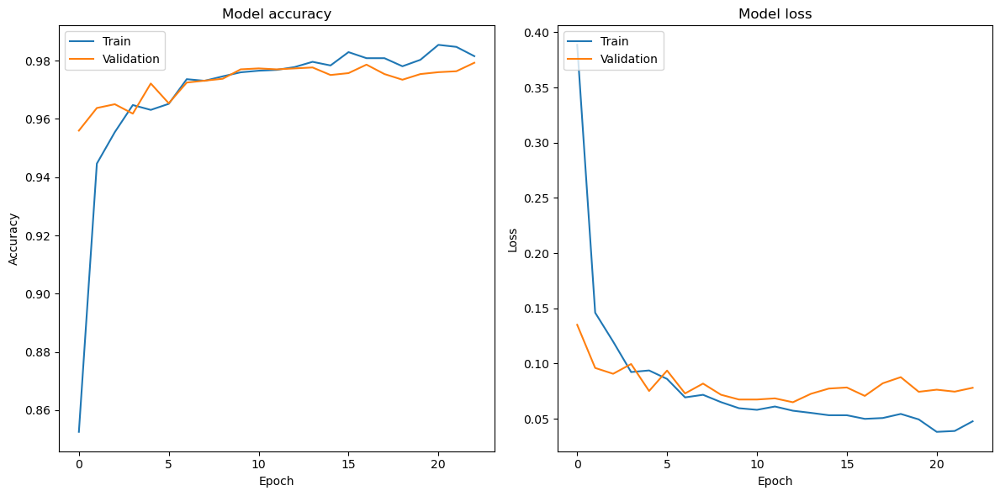

In [206]:
plt.figure(figsize=(12, 6))
plt.subplot(1, 2, 1)
plt.plot(lstm_history.history['accuracy'])
plt.plot(lstm_history.history['val_accuracy'])
plt.title('Model accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend(['Train', 'Validation'], loc='upper left')
plt.subplot(1, 2, 2)
plt.plot(lstm_history.history['loss'])
plt.plot(lstm_history.history['val_loss'])
plt.title('Model loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend(['Train', 'Validation'], loc='upper left')
plt.tight_layout()
plt.show()

In [211]:
testing_accuracy, conf_matrix = evaluate_model(lstm_model, X_test_reshaped, Y_test_encoded)

97/97 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
Testing Accuracy: 0.9773462783171522
Confusion Matrix:
[[597   0   0   0   0   0]
 [  1 535  24   0   0   3]
 [  0  31 516   0   0   0]
 [  0   0   0 537   1   1]
 [  0   0   0   2 415   3]
 [  0   0   0   2   2 420]]


In [216]:
X_train_PCA_reshaped = X_train_PCA.reshape((X_train_PCA.shape[0], 1, X_train_PCA.shape[1]))
X_test_PCA_reshaped = X_test_PCA.reshape((X_test_PCA.shape[0], 1, X_test_PCA.shape[1]))
lstm_model_PCA, lstm_history_PCA = train_lstm_model(X_train_PCA_reshaped, Y_train_encoded, 
                                            X_test_PCA_reshaped, Y_test_encoded)

Epoch 1/100
226/226 ━━━━━━━━━━━━━━━━━━━━ 4s 4ms/step - accuracy: 0.6854 - loss: 0.9195 - val_accuracy: 0.9579 - val_loss: 0.1237
Epoch 2/100
226/226 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.9562 - loss: 0.1264 - val_accuracy: 0.9618 - val_loss: 0.0972
Epoch 3/100
226/226 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.9695 - loss: 0.0831 - val_accuracy: 0.9689 - val_loss: 0.0839
Epoch 4/100
226/226 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.9749 - loss: 0.0639 - val_accuracy: 0.9712 - val_loss: 0.0788
Epoch 5/100
226/226 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.9787 - loss: 0.0553 - val_accuracy: 0.9709 - val_loss: 0.0761
Epoch 6/100
226/226 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.9832 - loss: 0.0446 - val_accuracy: 0.9738 - val_loss: 0.0754
Epoch 7/100
226/226 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.9819 - loss: 0.0427 - val_accuracy: 0.9770 - val_loss: 0.0647
Epoch 8/100
226/226 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.9860 - loss: 0.0334 - val_accu

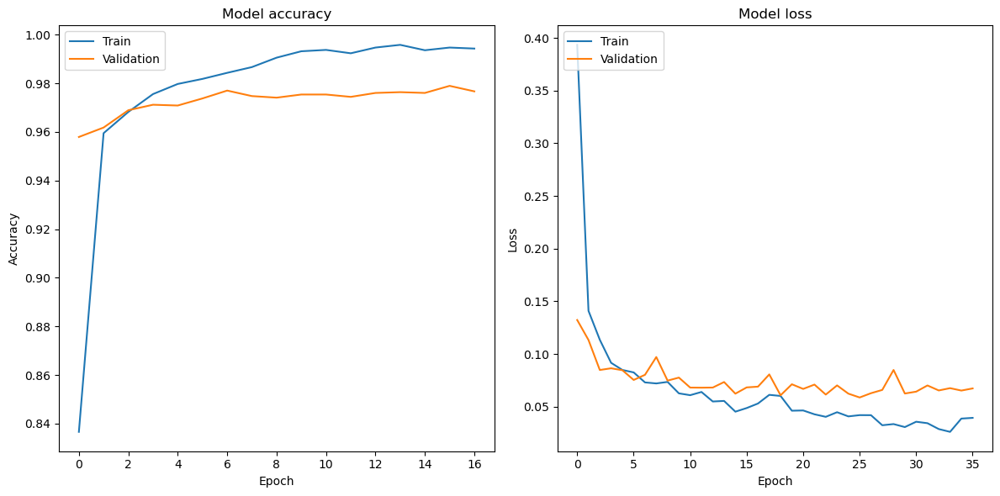

In [217]:
plt.figure(figsize=(12, 6))
plt.subplot(1, 2, 1)
plt.plot(lstm_history_PCA.history['accuracy'])
plt.plot(lstm_history_PCA.history['val_accuracy'])
plt.title('Model accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend(['Train', 'Validation'], loc='upper left')
plt.subplot(1, 2, 2)
plt.plot(lstm_history.history['loss'])
plt.plot(lstm_history.history['val_loss'])
plt.title('Model loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend(['Train', 'Validation'], loc='upper left')
plt.tight_layout()
plt.show()

In [218]:
testing_accuracy, conf_matrix = evaluate_model(lstm_model, X_test_reshaped, Y_test_encoded)

97/97 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step
Testing Accuracy: 0.9786407766990292
Confusion Matrix:
[[597   0   0   0   0   0]
 [  3 528  30   0   0   2]
 [  0  24 523   0   0   0]
 [  0   0   0 538   0   1]
 [  0   0   0   3 416   1]
 [  0   0   0   0   2 422]]
